# Session 5: Classify images with AI

This notebook demonstrates how to find, access, and deploy an AI model to process underwater imagery.  

## Step 1: Set up tools

This notebook depends on the ultralytics and torch packages.

In [1]:
# If the ultralytics package has not yet been installed, we'll install it.
try:
    import ultralytics
except ImportError:
    !pip install -q ultralytics


# The torch package is a dependency of the ultralytics package, and thus
# should already be installed. However it is good practice to confirm with a
# try/except.
try:
    import torch
except ImportError:
    !pip install -q torch

# Additional libraries are imported in later cells

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 866.9 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 61.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.2/66.2 kB 5.7 MB/s eta 0:00:00


First, we'll inspect our GPU environment. The OOI Jupyterhub's Pytorch notebook has 4 NVIDIA L40S GPUs, each with ~44GiB of VRAM.

If you're using Google Colab, you'll likely see 1 Tesla T4 GPU with ~14.5GiB of VRAM.

In [2]:
print("CUDA available:", torch.cuda.is_available())
print("PyTorch version:", torch.__version__)
print("PyTorch CUDA version:", torch.version.cuda)

def bytes_to_gib(num_bytes: int) -> float:
    return num_bytes / 1024**3

if torch.cuda.is_available():
    num_devs = torch.cuda.device_count()
    print(f"Number of GPUs: {num_devs}")
    dev_num = torch.cuda.current_device()
    gpu_type = torch.cuda.get_device_name(dev_num)
    print(f"Current GPU: {gpu_type}")
    print("\nGPU details:")
    for dev in range(num_devs):
        properties = torch.cuda.get_device_properties(dev)
        free_mem, total_mem = torch.cuda.mem_get_info(dev)
        print(f"\nGPU {dev}: {properties.name}")
        print(f"  Total VRAM:          {bytes_to_gib(properties.total_memory):.2f} GiB")
else:
    print("No GPU found, using CPU")



CUDA available: True
PyTorch version: 2.11.0+cu128
PyTorch CUDA version: 12.8
Number of GPUs: 1
Current GPU: Tesla T4

GPU details:

GPU 0: Tesla T4
  Total VRAM:          14.56 GiB


## Step 2: Find data and pre-trained model

Our next step is to find a pre-trained model to run inference on our imagery. We'll be using the SHR (Southern Hydrate Ride) DSCAM (Digital Still Camera) YOLOv11 model described in this paper: https://aslopubs.onlinelibrary.wiley.com/doi/10.1002/lom3.70057.

The model card is located here: https://huggingface.co/atticus-carter/SHR_DSCAM.

Using the ultralytics package, we can download the model directly from the Hugging Face URL to use it in Python.

The model is about 130MB and will be downloaded in your notebook space to "weights/best.pt".

In [ ]:
from ultralytics import YOLO
yolo_model = YOLO("https://huggingface.co/atticus-carter/SHR_DSCAM/resolve/main/best.pt")

Found https://huggingface.co/atticus-carter/SHR_DSCAM/resolve/main/best.pt locally at weights/best.pt


To test that the model has been properly initialized, we can run it on imagery that the model was trained on.

Per the paper, the model was trained on imagery from the 2022-2023 DSCAM deployment. Below, we run it on an image from November 2022.

Each of the arguments for the `predict` command is:
- source: The input data to run inference on.
- save: Whether to save our output inference to disk.
- save_txt: Whether to save the detection outputs to txt files.
- save_conf: Whether to save the confidence scores of each detection in the detection txt files.
- imgsz: The image size to resize each incoming image to. Taken from the model arguments for this model here: https://huggingface.co/atticus-carter/SHR_DSCAM/blob/main/args.yaml.
- conf: The confidence score threshold -- all detections below this confidence value will be ignored. There is no "correct" value here -- 0.6 is chosen as a medium value.


Found https://rawdata.oceanobservatories.org/files/RS01SUM2/MJ01B/CAMDSB103/2022/11/04/CAMDSB103_10.33.7.5_20221104T004544_UTC.jpg locally at CAMDSB103_10.33.7.5_20221104T004544_UTC.jpg
image 1/1 /content/CAMDSB103_10.33.7.5_20221104T004544_UTC.jpg: 768x1024 3 Sebastess, 123.8ms
Speed: 7.9ms preprocess, 123.8ms inference, 16.9ms postprocess per image at shape (1, 3, 768, 1024)
Results saved to /content/runs/detect/predict-2
1 label saved to /content/runs/detect/predict-2/labels


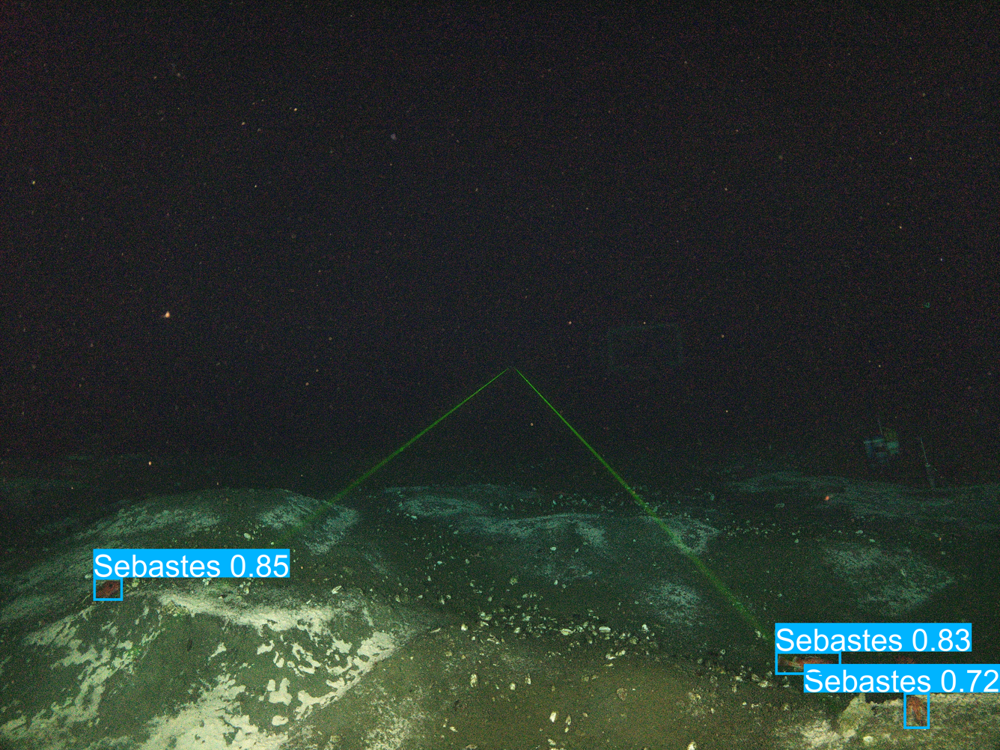

In [ ]:
data_path = "/home/jovyan/ooi/rsn_cabled/rsn_data/DVT_Data/mj01b/CAMDSB103_10.33.7.5/2022/11/04/CAMDSB103_10.33.7.5_20221104T004544_UTC.jpg"
#data_path = "https://rawdata.oceanobservatories.org/files/RS01SUM2/MJ01B/CAMDSB103/2022/11/04/CAMDSB103_10.33.7.5_20221104T004544_UTC.jpg"
results = yolo_model.predict(
    source=data_path,
    save=True,
    save_txt=True,
    save_conf=True,
    imgsz=1024,
    conf=0.6,
)
img = results[0].plot(pil=True)

scale = 0.25  # 25% size

display(
    img.resize(
        (int(img.width * scale),
         int(img.height * scale))
    )
)



## Step 3: Run on recent Southern Hydrate Ridge imagery

Next, we'll run on some data from outside the model's training set.

The following image is from the same DSCAM at the SHR, but is from December 2025. You can see that the camera is now pointed at a different feature.


Found https://rawdata.oceanobservatories.org/files/RS01SUM2/MJ01B/CAMDSB103/2025/12/01/CAMDSB103_10.33.7.5_20251201T021648_UTC.jpg locally at CAMDSB103_10.33.7.5_20251201T021648_UTC.jpg
image 1/1 /content/CAMDSB103_10.33.7.5_20251201T021648_UTC.jpg: 768x1024 1 Euphausia, 3 Sebastess, 157.0ms
Speed: 7.4ms preprocess, 157.0ms inference, 1.7ms postprocess per image at shape (1, 3, 768, 1024)
Results saved to /content/runs/detect/predict-2
2 labels saved to /content/runs/detect/predict-2/labels


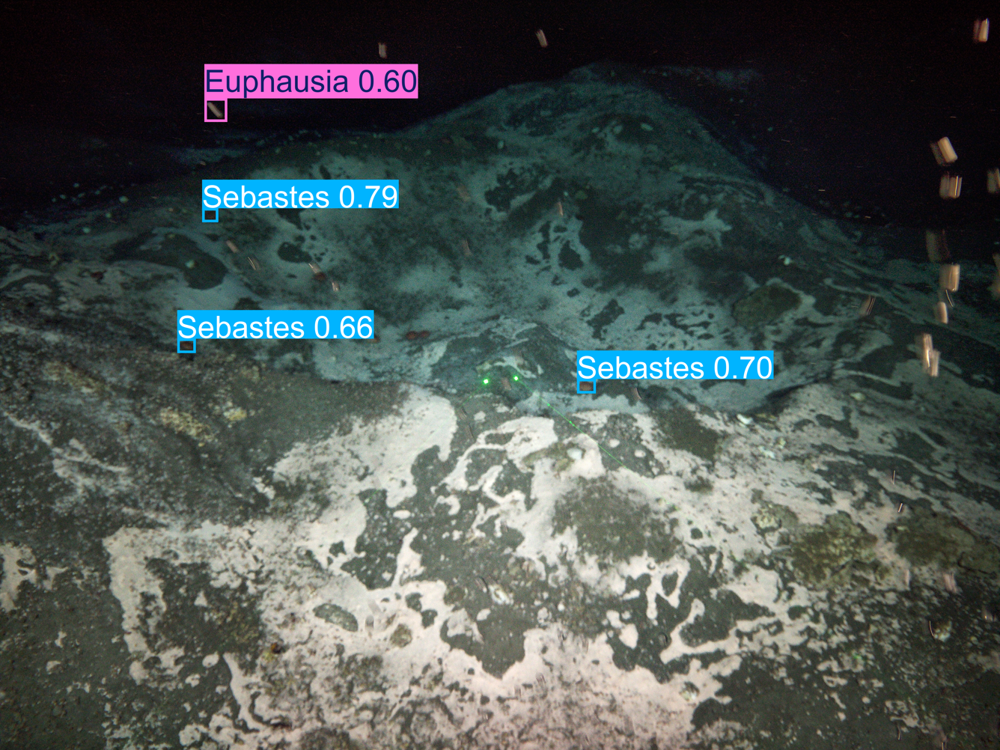

In [ ]:
data_path = "/home/jovyan/ooi/rsn_cabled/rsn_data/DVT_Data/mj01b/CAMDSB103_10.33.7.5/2025/12/01/CAMDSB103_10.33.7.5_20251201T021648_UTC.jpg"
#data_path = "https://rawdata.oceanobservatories.org/files/RS01SUM2/MJ01B/CAMDSB103/2025/12/01/CAMDSB103_10.33.7.5_20251201T021648_UTC.jpg"
results = yolo_model.predict(
    source=data_path,
    save=True,
    save_txt=True,
    save_conf=True,
    imgsz=1024,
    conf=0.6,
)
img = results[0].plot(pil=True)
display(
    img.resize(
        (int(img.width * scale),
         int(img.height * scale))
    )
)

Notably, the confidence scores are slightly lower than when we ran the model on imagery from its training set. As the input data differs from a model's training data, the model may have lower confidence and lower accuracy.

## Step 4: Run on ROV Jason imagery

We'll next run the model on some data from the ROV Jason -- imagery that the original model was not trained on.

First, we'll download the image from the WHOI sealog server and save it as a file in our notebook environment.

As shown in the previous cells, the `predict` function in the ultralytics package can run directly on image URLs. When running an image URL, the function will download the image to the notebook's directory. When running directly on files in the JupyterHub, no download is required for the data-proximate computing.


However, if we wanted to explicitly fetch the image URL and save it under a different name, we could use the `requests` package to fetch the image, and then give the local path to the `predict` function.

In [ ]:
from pathlib import Path
import requests

# Image URL
url = "https://sealog.whoi.edu/sealog-jason/server/files/images/J2-1715/SulisCam/SulisCam.20250813_030949000.jpg"

data_path = Path("rov_image.jpg") # for demonstration purposes save the image under a different name

response = requests.get(url)
response.raise_for_status()

with open(data_path, "wb") as f:
    f.write(response.content)


Now that the image is downloaded, we can run inference on it.


image 1/1 /content/rov_image.jpg: 576x1024 3 Sebastess, 127.4ms
Speed: 5.0ms preprocess, 127.4ms inference, 1.4ms postprocess per image at shape (1, 3, 576, 1024)
Results saved to /content/runs/detect/predict-2
3 labels saved to /content/runs/detect/predict-2/labels


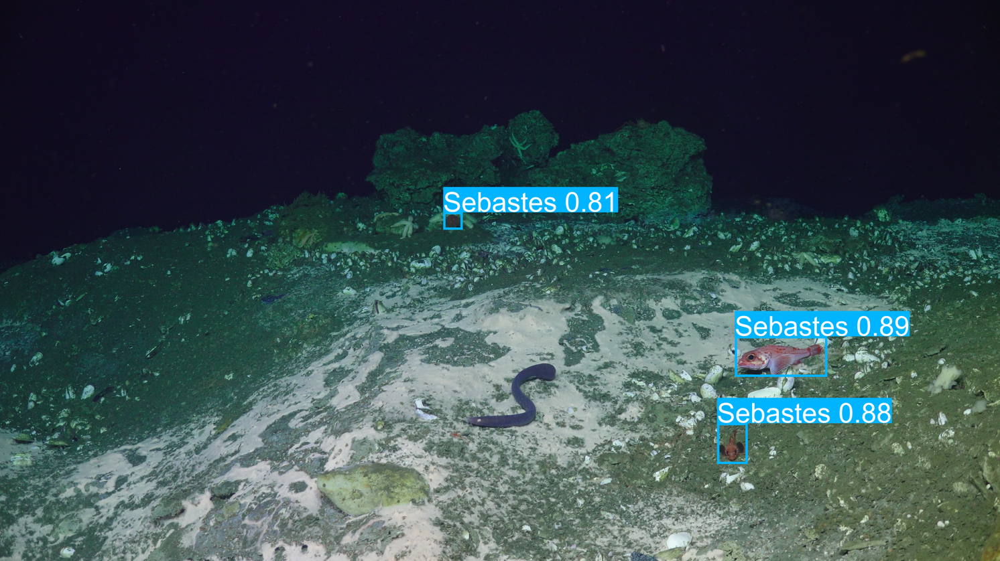

In [ ]:
results = yolo_model.predict(
    source=data_path,
    save=True,
    save_txt=True,
    save_conf=True,
    imgsz=1024,
    conf=0.6,
)
img = results[0].plot(pil=True)
display(
    img.resize(
        (int(img.width * scale),
         int(img.height * scale))
    )
)